In [149]:
%matplotlib inline
import seaborn
import numpy, scipy, IPython.display as ipd, matplotlib.pyplot as plt
import librosa, librosa.display
plt.rcParams['figure.figsize'] = (14, 8)

Carrega o audio

In [151]:
filename = 'd-g-c.wav'
x, sr = librosa.load(filename)

Adiciona o arquivo de audio

In [152]:
ipd.Audio(x, rate=sr)

Exibe o CQT do sinal

#CQT = Constante-Q de Transformação. Ajuda na redução de ruidos.

Onde:
    
    x: séries temporais de audio
    sr: taxa de amostragem de x (>0)
    bins_per_octave: numero de bins por oitava    
    n_bins: numero de bins de frequencia, começando na frequencia minima(C1 ~= 32,70 Hz)

In [153]:
# bins_per_octave = 36
# n_bins = 300
bins_per_octave = 12 * 3
n_octaves = 7
cqt = librosa.cqt(x, sr=sr, n_bins=(n_octaves * bins_per_octave), bins_per_octave=bins_per_octave)
log_cqt = librosa.amplitude_to_db(cqt)

# librosa.display.specshow(abs(cqt), sr=sr, x_axis='time', y_axis='cqt_note')

cqt.shape

/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:983: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


(252, 5915)

#specshow(data[, x_coords, y_coords, x_axis, …]) 
    
    return: Exibe um espectrograma / cromatro / cqt / etc.

Objetivo: Identificar o tom de cada nota e substitua cada nota por um tom puro desse tom.

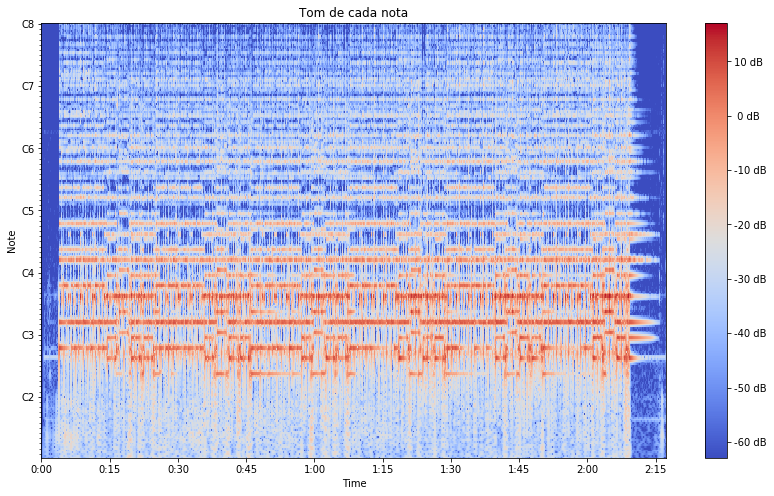

In [154]:
librosa.display.specshow(log_cqt, sr=sr, x_axis='time', y_axis='cqt_note', bins_per_octave=bins_per_octave)
plt.title('Tom de cada nota')
plt.colorbar(format='%2.0f dB')


Para onset.onset_strength:

    os parametros são:

        x: séries temporais de audio
        sr: taxa de amostragem de x (>0)
        hop_length: comprimento do salto (por amostragem)
        
    return: vetor contendo o envelope da força de inicio

Text(0.5, 1.0, 'Envelope da força inical')

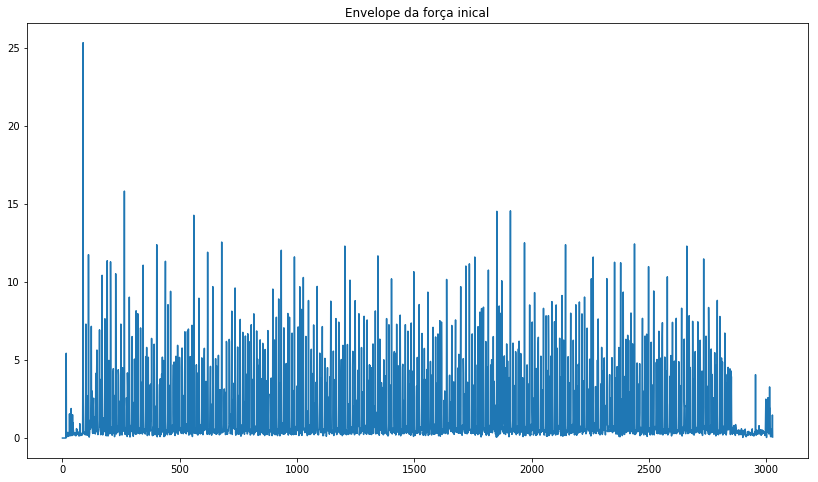

In [167]:
hop_length = 1000
onset_env = librosa.onset.onset_strength(x, sr=sr, hop_length=hop_length)

plt.plot(onset_env)

plt.title('Envelope da força inical')

# plt.xlim(0, len(onset_env)) -> (0, 11210)

Escolha de parâmetros que preservem os grandes picos, ignorando os pequenos picos.

Em seguida, detectamos os onsets. 

Para onset.onset_detect:

    os parametros são:

        x: séries temporais de audio
        sr: taxa de amostragem de x (>0)
        hop_length: comprimento do salto (por amostragem)
        units: unidades para codificar os eventos de inicio dectados ('frames','samples','time')
        backtrack: Util para usar em onsets de ponto de fatia para segmentação
        pre_max, post_max, pre_avg, post_avg, delta: parametros adicionais para o pico de picking
        
    return: posição estimada de onsets detectados.

In [168]:
onset_samples = librosa.onset.onset_detect(x,
                                           sr=sr, units='samples', 
                                           hop_length=hop_length, 
                                           backtrack=False,
                                           pre_max=20,
                                           post_max=20,
                                           pre_avg=100,
                                           post_avg=100,
                                           delta=0.2,
                                           wait=0)

onset_samples

array([  88000,  111000,  169000,  191000,  227000,  264000,  285000,
        314000,  344000,  402000,  439000,  461000,  560000,  582000,
        619000,  641000,  679000,  736000,  758000,  816000,  876000,
        897000,  933000,  961000,  989000, 1027000, 1049000, 1086000,
       1108000, 1144000, 1166000, 1204000, 1226000, 1248000, 1286000,
       1345000, 1382000, 1403000, 1440000, 1462000, 1498000, 1521000,
       1558000, 1580000, 1609000, 1638000, 1676000, 1698000, 1735000,
       1758000, 1795000, 1816000, 1852000, 1873000, 1910000, 1970000,
       1992000, 2013000, 2051000, 2087000, 2145000, 2167000, 2204000,
       2226000, 2263000, 2284000, 2321000, 2354000, 2380000, 2439000,
       2473000, 2499000, 2521000, 2558000, 2579000, 2617000, 2640000,
       2662000, 2709000, 2734000, 2755000, 2792000, 2824000])

Preenche os onsets com o começo e o fim do sinal.

In [169]:
onset_boundaries = numpy.concatenate([[0], onset_samples, [len(x)]])

onset_boundaries

array([      0,   88000,  111000,  169000,  191000,  227000,  264000,
        285000,  314000,  344000,  402000,  439000,  461000,  560000,
        582000,  619000,  641000,  679000,  736000,  758000,  816000,
        876000,  897000,  933000,  961000,  989000, 1027000, 1049000,
       1086000, 1108000, 1144000, 1166000, 1204000, 1226000, 1248000,
       1286000, 1345000, 1382000, 1403000, 1440000, 1462000, 1498000,
       1521000, 1558000, 1580000, 1609000, 1638000, 1676000, 1698000,
       1735000, 1758000, 1795000, 1816000, 1852000, 1873000, 1910000,
       1970000, 1992000, 2013000, 2051000, 2087000, 2145000, 2167000,
       2204000, 2226000, 2263000, 2284000, 2321000, 2354000, 2380000,
       2439000, 2473000, 2499000, 2521000, 2558000, 2579000, 2617000,
       2640000, 2662000, 2709000, 2734000, 2755000, 2792000, 2824000,
       3028385])

Converte os onsets para segundos:

In [170]:
onset_times = librosa.samples_to_time(onset_boundaries, sr=sr)

onset_times

array([  0.        ,   3.99092971,   5.03401361,   7.66439909,
         8.66213152,  10.29478458,  11.97278912,  12.92517007,
        14.24036281,  15.60090703,  18.23129252,  19.90929705,
        20.90702948,  25.3968254 ,  26.39455782,  28.07256236,
        29.07029478,  30.79365079,  33.37868481,  34.37641723,
        37.00680272,  39.72789116,  40.68027211,  42.31292517,
        43.58276644,  44.85260771,  46.57596372,  47.57369615,
        49.25170068,  50.24943311,  51.88208617,  52.87981859,
        54.6031746 ,  55.60090703,  56.59863946,  58.32199546,
        60.99773243,  62.67573696,  63.62811791,  65.30612245,
        66.30385488,  67.93650794,  68.97959184,  70.65759637,
        71.6553288 ,  72.97052154,  74.28571429,  76.00907029,
        77.00680272,  78.68480726,  79.72789116,  81.40589569,
        82.35827664,  83.99092971,  84.94331066,  86.62131519,
        89.34240363,  90.34013605,  91.29251701,  93.01587302,
        94.64852608,  97.27891156,  98.27664399,  99.95

#waveplot(y [, sr, max_points, x_axis,…])  

    return: Plote o envelope de amplitude de uma forma de onda.

Text(0.5, 1.0, 'Amplitude da forma da onda')

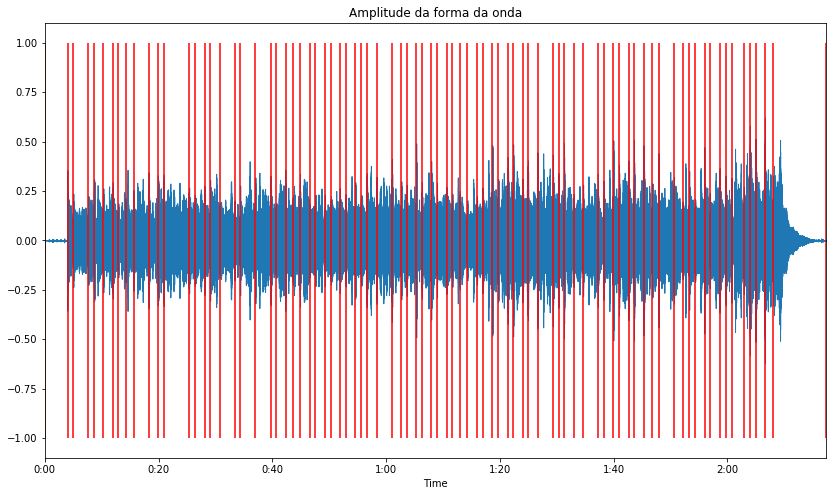

In [171]:
librosa.display.waveplot(x, sr=sr)
plt.vlines(onset_times, -1, 1, color='r')

plt.title('Amplitude da forma da onda')



Estima o tom usando o método de autocorrelação:

In [179]:
def estimate_pitch(segment, sr, fmin=50.0, fmax=20000.0):
    
    # Computa a autocorrelação do segmento de entrada.
    r = librosa.autocorrelate(segment)
    
    # Defini os limites inferiores e superiores para o argmax de autocorrelação.
    i_min = sr/fmax
    i_max = sr/fmin
    r[:int(i_min)] = 0
    r[int(i_max):] = 0
    
    # Encontra a localização da autocorrelação máxima. 
    i = r.argmax()
    f0 = float(sr)/i
    return f0

Gera um tom puro na frequência especificada:

In [180]:
def generate_sine(f0, sr, n_duration):
    n = numpy.arange(n_duration)
    return 0.2*numpy.sin(2*numpy.pi*f0*n/float(sr))

Função auxiliar para uso em uma compreensão de lista:

In [181]:
def estimate_pitch_and_generate_sine(x, onset_samples, i, sr):
    n0 = onset_samples[i]
    n1 = onset_samples[i+1]
    f0 = estimate_pitch(x[n0:n1], sr)
    return generate_sine(f0, sr, n1-n0)

Compreensão de lista para concatenar os segmentos sintetizados:

In [182]:
y = numpy.concatenate([
    estimate_pitch_and_generate_sine(x, onset_boundaries, i, sr=sr)
    for i in range(len(onset_boundaries)-1)
])

/usr/local/lib/python3.6/dist-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


Transcrição sintetizada.

In [183]:
ipd.Audio(y, rate=sr)

Plote o CQT da transcrição sintetizada.

In [184]:
cqt = librosa.cqt(y, sr=sr)

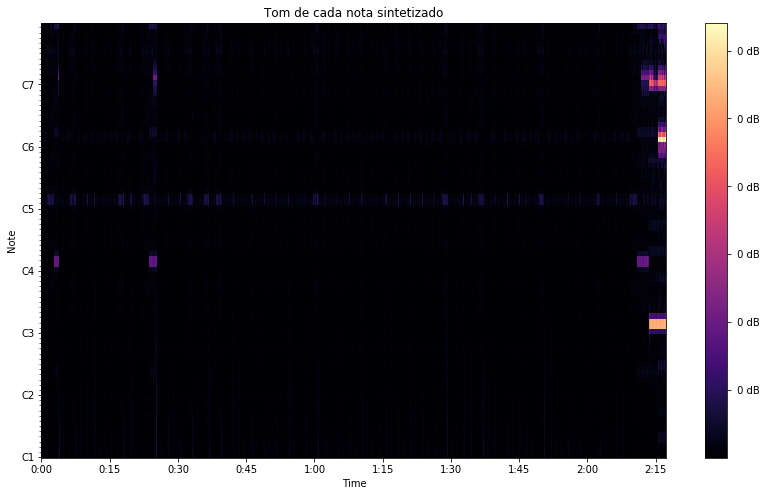

In [185]:
librosa.display.specshow(abs(cqt), sr=sr, x_axis='time', y_axis='cqt_note')

# plt.rcParams['figure.figsize'] = (14, 14)

plt.title('Tom de cada nota sintetizado')
plt.colorbar(format='%2.0f dB')
